# Ch2: Compression

## Image Quantization

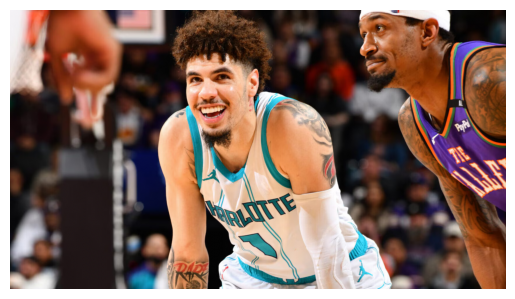

In [21]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np 

# Load the image
image_path = 'data/nba_lamelo.jpg'
image = mpimg.imread(image_path) / 255

# Display the image
plt.imshow(image)
plt.axis('off')
plt.show()

In [31]:
def get_scale(x_min, x_max, b):
    return (x_max - x_min) * 1.0 / (2**b)
    
def quantize(x, x_min, x_max, b):
    x = np.minimum(x, x_max)
    x = np.maximum(x, x_min)

    scale = get_scale(x_min, x_max, b)
    x_q = np.floor((x - x_min) / scale)
    
    x_q = np.minimum(x_q, 2**b - 1)
    return x_q.astype(np.uint8)

def dequantize(x_q, x_min, x_max, b):
    s = get_scale(x_min, x_max, b)
    x = x_min + (s * x_q)
    return x

def simulate_transmission(img, b):
    transmitted_image = quantize(img, 0.0, 1.0, b)
    decoded_image = dequantize(transmitted_image, 0.0, 1.0, b)
    return decoded_image

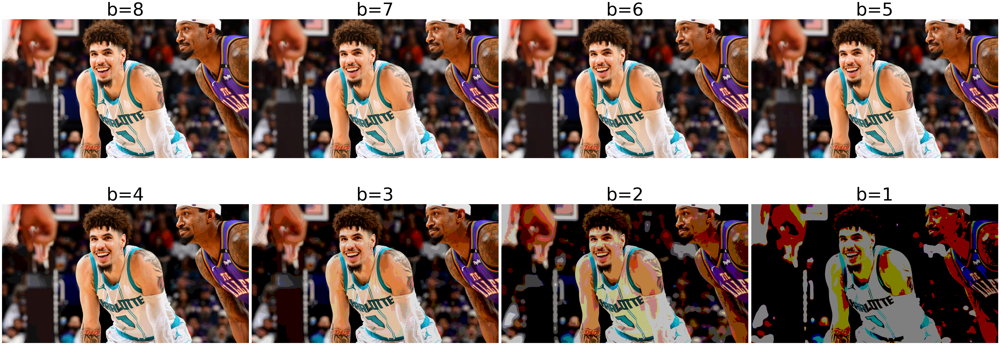

In [44]:
fig, axes = plt.subplots(2, 4, figsize=(50, 20))

for i, ax in zip(range(8, 0, -1), axes.flat):
    decoded_image = simulate_transmission(image, b=i)
    ax.set_title(f'b={i}', fontsize=64)
    ax.imshow(decoded_image)
    ax.axis("off")
plt.tight_layout()
plt.show()